In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import statsmodels.api as sm
import datetime
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error as mae
from keras.models import Sequential
from keras.layers import Dense, Dropout
from sklearn.metrics import confusion_matrix
import math
import seaborn as sn
from scipy.stats import pearsonr

In /home/vipin/.local/lib/python3.6/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The text.latex.preview rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In /home/vipin/.local/lib/python3.6/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The mathtext.fallback_to_cm rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In /home/vipin/.local/lib/python3.6/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: Support for setting the 'mathtext.fallback_to_cm' rcParam is deprecated since 3.3 and will be removed two minor releases later; use 'mathtext.fallback : 'cm' instead.
In /home/vipin/.local/lib/python3.6/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The validate_bool_maybe_none function was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In /home/vipin/.local/lib/python3.6/site-packages/matplotlib/mpl-data/stylel

In [2]:
df = pd.read_csv("BTP Data-001/BTP Data/Process_Rainfall_Data/32Coimbatore-Nirar_processed.csv")

In [3]:
df

,Date,RF
0,1983-01-01,0.0
1,1983-01-02,0.0
2,1983-01-03,0.0
3,1983-01-04,0.0
4,1983-01-05,0.0
...,...,...
9121,2014-05-27,4.0
9122,2014-05-28,0.0
9123,2014-05-29,12.0
9124,2014-05-30,0.0


In [4]:
df = df.replace(-1.0,np.nan)

In [5]:
df

,Date,RF
0,1983-01-01,0.0
1,1983-01-02,0.0
2,1983-01-03,0.0
3,1983-01-04,0.0
4,1983-01-05,0.0
...,...,...
9121,2014-05-27,4.0
9122,2014-05-28,0.0
9123,2014-05-29,12.0
9124,2014-05-30,0.0


In [6]:
df = df.assign(RF=df.RF.interpolate(method='linear',limit_direction='both'))

In [7]:
df

,Date,RF
0,1983-01-01,0.0
1,1983-01-02,0.0
2,1983-01-03,0.0
3,1983-01-04,0.0
4,1983-01-05,0.0
...,...,...
9121,2014-05-27,4.0
9122,2014-05-28,0.0
9123,2014-05-29,12.0
9124,2014-05-30,0.0


In [8]:
df.isna().sum()

Date    0
RF      0
dtype: int64

In [9]:
tot_RF = []
latency = 7
dt = []
week = []
for i in range(0,len(df)-latency,latency):
    tot_RF.append(np.sum(df['RF'][i:i+latency]))
    dd = str(df['Date'][i])+ "~" + str(df['Date'][i+latency])
    dt.append(dd)

In [10]:
len(dt)

1303

In [11]:
data = tot_RF
U = [min(data) , max(data)]

In [12]:
DATA = (data-U[0])/(U[1] - U[0])
Data = (np.array(DATA))
Data = np.reshape(Data , (Data.shape[0],1))

slt1 = int(0.80*len(data))
slt2 = int(0.90*len(data))
Train = Data[:slt1]
Val = Data[slt1:slt2]
Test = Data[slt1:]
DT = dt[slt1:]

In [13]:
x_axis = [i+1 for i in range(len(data))]
x_tr = x_axis[:slt1]
x_val = x_axis[slt1:slt2]
x_tst = x_axis[slt2:]
al = (U[1] - U[0]) + U[0]

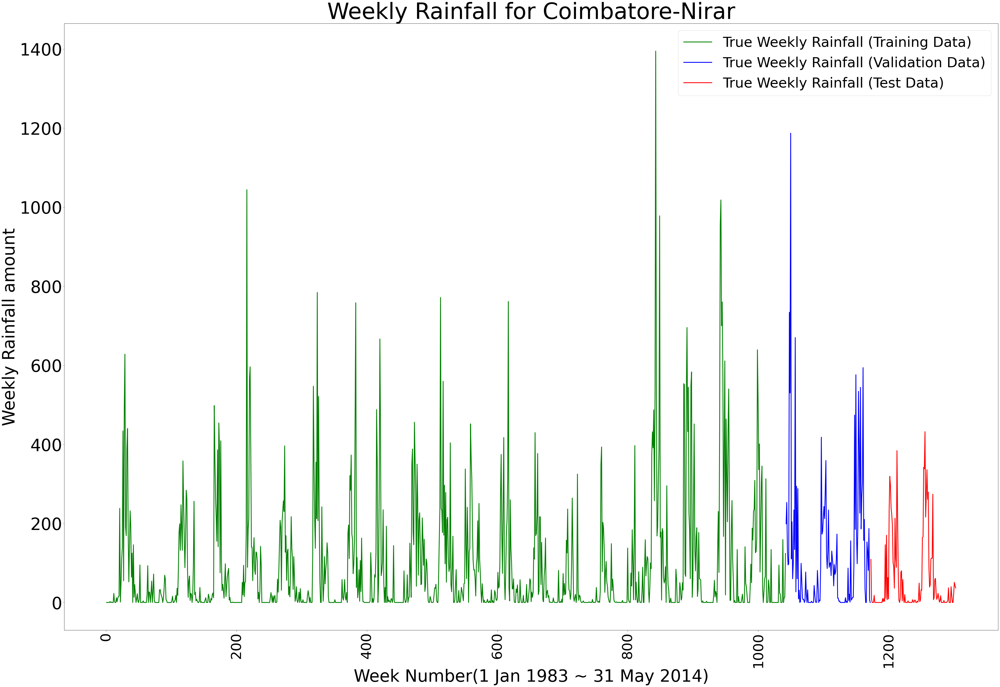

In [15]:
f = plt.figure() 
f.set_figwidth(60) 
f.set_figheight(40)
plt.title('Weekly Rainfall for Coimbatore-Nirar', fontsize = 80)
plt.xticks(fontsize=50, rotation=90)
plt.yticks(fontsize=60, rotation=0)
#plt.xticks(ticks,xaxis)
plt.ylabel('Weekly Rainfall amount',fontsize=60)
plt.xlabel('Week Number(1 Jan 1983 ~ 31 May 2014)',fontsize=60)
plt.plot(x_tr, Train*al, 'g',linestyle='-', linewidth='3', label = 'True Weekly Rainfall (Training Data)')
plt.plot(x_val, Val*al, 'b',linestyle='-', linewidth='3', label = 'True Weekly Rainfall (Validation Data)')
plt.plot(x_tst, Data[slt2:]*al, 'r',linestyle='-', linewidth='3', label = 'True Weekly Rainfall (Test Data)')
plt.legend(loc='best',prop={'size': 50})

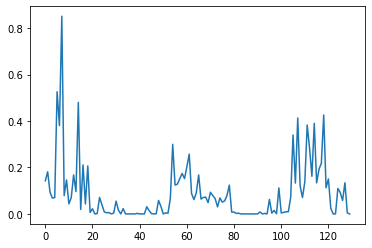

In [16]:
plt.plot(Val)

In [33]:
import GMM_K

numStates = 7
numMixtureComp = 2
dimension = 1
numIterations = 200
threshold = 0.0
covariance_type = 'full'
verbose = True


model = GMM_K.GmmHmmLikelihoodSimilarity_K(
    numStates=numStates,
    numMixtureComp=numMixtureComp,
    dimension=dimension,
    numIterations=numIterations,
    threshold=threshold,
    covariance_type=covariance_type,
    verbose = True
)

In [34]:
logValues = model.train([Train])

         1         404.8271             +nan
         2        1308.6373        +903.8102
         3        1568.1571        +259.5198
         4        1789.7238        +221.5667
         5        1977.9348        +188.2109
         6        2123.6276        +145.6928
         7        2243.6053        +119.9778
         8        2343.9920        +100.3867
         9        2426.6454         +82.6534
        10        2497.5436         +70.8983
        11        2571.6841         +74.1404
        12        2651.7041         +80.0200
        13        2736.7293         +85.0252
        14        2843.6434        +106.9141
        15        3018.2625        +174.6191
        16        3276.8974        +258.6349
        17        3576.3551        +299.4577
        18        3850.9697        +274.6146
        19        4243.6949        +392.7252
        20        5107.6801        +863.9852
        21       29501.1274      +24393.4473
        22        3083.4017      -26417.7257
Covariance

Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of 

Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of 

Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of 

Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of 

Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of 

Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of 

Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of 

Has model converged:  True


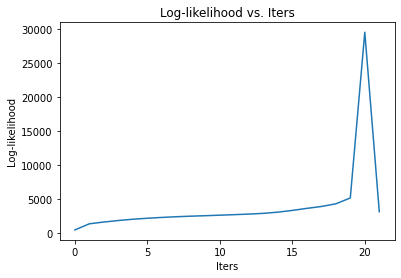

In [35]:
plt.plot(logValues, label='log-likelihood')
plt.xlabel('Iters')
plt.ylabel('Log-likelihood')
plt.title('Log-likelihood vs. Iters')
print('Has model converged: ', model.model.monitor_.converged)

In [36]:
K = len(Train)
rmse = []
MAE = []
CC = []
for k in range(1,K):
    pred = model.predict(Val,k)
    p2 = pred*(U[1] - U[0]) + U[0]
    T1 = Val*(U[1] - U[0]) + U[0]
    rmse.append(mean_squared_error(p2, T1, squared=False))
    MAE.append(mae(T1,p2))
    d1 = np.array(T1)
    d1 = np.reshape(d1 , d1.shape[0])
    d2 = np.array(p2)
    d2 = np.reshape(d2 , d2.shape[0])
    corr, _ = pearsonr(d1, d2)
    CC.append(corr)
    print(k)

Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

1


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

2


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

3


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

4


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

5


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

6


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

7


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

8


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

9


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

10


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

11


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

12


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

13


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

14


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

15


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

16


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

17


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

18


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

19


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

20


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

21


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

22


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

23


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

24


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

25


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

26


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

27


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

28


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

29


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

30


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

31


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

32


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

33


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

34


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

35


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

36


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

37


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

38


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

39


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

40


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

41


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

42


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

43


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

44


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

45


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

46


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

47


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

48


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

49


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

50


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

51


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

52


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

53


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

54


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

55


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

56


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

57


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

58


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

59


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

60


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

61


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

62


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

63


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

64


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

65


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

66


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

67


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

68


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

69


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

70


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

71


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

72


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

73


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

74


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

75


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

76


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

77


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

78


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

79


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

80


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

81


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

82


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

83


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

84


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

85


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

86


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

87


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

88


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

89


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

90


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

91


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

92


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

93


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

94


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

95


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

96


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

97


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

98


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

99


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

100


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

101


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

102


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

103


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

104


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

105


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

106


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

107


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

108


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

109


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

110


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

111


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

112


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

113


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

114


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

115


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

116


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

117


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

118


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

119


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

120


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

121


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

122


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

123


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

124


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

125


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

126


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

127


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

128


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

129


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

130


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

131


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

132


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

133


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

134


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

135


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

136


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

137


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

138


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

139


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

140


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

141


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

142


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

143


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

144


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

145


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

146


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

147


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

148


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

149


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

150


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

151


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

152


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

153


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

154


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

155


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

156


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

157


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

158


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

159


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

160


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

161


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

162


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

163


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

164


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

165


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

166


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

167


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

168


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

169


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

170


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

171


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

172


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

173


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

174


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

175


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

176


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

177


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

178


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

179


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

180


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

181


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

182


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

183


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

184


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

185


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

186


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

187


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

188


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

189


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

190


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

191


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

192


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

193


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

194


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

195


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

196


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

197


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

198


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

199


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

200


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

201


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

202


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

203


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

204


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

205


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

206


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

207


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

208


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

209


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

210


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

211


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

212


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

213


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

214


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

215


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

216


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

217


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

218


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

219


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

220


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

221


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

222


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

223


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

224


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

225


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

226


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

227


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

228


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

229


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

230


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

231


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

232


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

233


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

234


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

235


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

236


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

237


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

238


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

239


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

240


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

241


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

242


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

243


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

244


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

245


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

246


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

247


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

248


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

249


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

250


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

251


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

252


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

253


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

254


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

255


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

256


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

257


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

258


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

259


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

260


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

261


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

262


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

263


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

264


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

265


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

266


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

267


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

268


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

269


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

270


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

271


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

272


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

273


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

274


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

275


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

276


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

277


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

278


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

279


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

280


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

281


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

282


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

283


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

284


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

285


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

286


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

287


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

288


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

289


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

290


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

291


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

292


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

293


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

294


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

295


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

296


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

297


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

298


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

299


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

300


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

301


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

302


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

303


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

304


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

305


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

306


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

307


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

308


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

309


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

310


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

311


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

312


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

313


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

314


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

315


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

316


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

317


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

318


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

319


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

320


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

321


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

322


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

323


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

324


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

325


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

326


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

327


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

328


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

329


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

330


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

331


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

332


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

333


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

334


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

335


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

336


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

337


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

338


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

339


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

340


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

341


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

342


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

343


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

344


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

345


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

346


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

347


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

348


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

349


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

350


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

351


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

352


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

353


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

354


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

355


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

356


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

357


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

358


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

359


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

360


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

361


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

362


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

363


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

364


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

365


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

366


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

367


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

368


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

369


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

370


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

371


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

372


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

373


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

374


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

375


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

376


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

377


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

378


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

379


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

380


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

381


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

382


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

383


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

384


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

385


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

386


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

387


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

388


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

389


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

390


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

391


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

392


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

393


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

394


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

395


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

396


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

397


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

398


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

399


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

400


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

401


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

402


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

403


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

404


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

405


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

406


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

407


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

408


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

409


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

410


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

411


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

412


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

413


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

414


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

415


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

416


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

417


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

418


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

419


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

420


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

421


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

422


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

423


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

424


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

425


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

426


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

427


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

428


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

429


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

430


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

431


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

432


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

433


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

434


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

435


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

436


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

437


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

438


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

439


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

440


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

441


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

442


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

443


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

444


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

445


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

446


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

447


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

448


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

449


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

450


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

451


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

452


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

453


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

454


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

455


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

456


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

457


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

458


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

459


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

460


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

461


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

462


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

463


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

464


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

465


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

466


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

467


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

468


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

469


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

470


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

471


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

472


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

473


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

474


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

475


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

476


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

477


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

478


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

479


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

480


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

481


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

482


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

483


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

484


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

485


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

486


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

487


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

488


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

489


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

490


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

491


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

492


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

493


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

494


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

495


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

496


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

497


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

498


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

499


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

500


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

501


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

502


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

503


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

504


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

505


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

506


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

507


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

508


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

509


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

510


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

511


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

512


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

513


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

514


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

515


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

516


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

517


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

518


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

519


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

520


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

521


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

522


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

523


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

524


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

525


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

526


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

527


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

528


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

529


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

530


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

531


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

532


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

533


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

534


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

535


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

536


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

537


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

538


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

539


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

540


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

541


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

542


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

543


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

544


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

545


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

546


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

547


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

548


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

549


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

550


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

551


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

552


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

553


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

554


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

555


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

556


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

557


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

558


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

559


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

560


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

561


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

562


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

563


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

564


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

565


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

566


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

567


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

568


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

569


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

570


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

571


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

572


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

573


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

574


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

575


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

576


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

577


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

578


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

579


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

580


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

581


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

582


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

583


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

584


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

585


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

586


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

587


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

588


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

589


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

590


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

591


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

592


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

593


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

594


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

595


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

596


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

597


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

598


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

599


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

600


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

601


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

602


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

603


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

604


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

605


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

606


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

607


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

608


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

609


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

610


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

611


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

612


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

613


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

614


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

615


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

616


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

617


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

618


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

619


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

620


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

621


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

622


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

623


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

624


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

625


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

626


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

627


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

628


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

629


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

630


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

631


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

632


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

633


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

634


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

635


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

636


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

637


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

638


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

639


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

640


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

641


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

642


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

643


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

644


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

645


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

646


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

647


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

648


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

649


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

650


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

651


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

652


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

653


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

654


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

655


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

656


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

657


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

658


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

659


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

660


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

661


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

662


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

663


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

664


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

665


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

666


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

667


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

668


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

669


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

670


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

671


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

672


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

673


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

674


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

675


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

676


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

677


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

678


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

679


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

680


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

681


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

682


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

683


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

684


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

685


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

686


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

687


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

688


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

689


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

690


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

691


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

692


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

693


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

694


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

695


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

696


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

697


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

698


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

699


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

700


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

701


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

702


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

703


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

704


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

705


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

706


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

707


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

708


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

709


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

710


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

711


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

712


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

713


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

714


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

715


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

716


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

717


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

718


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

719


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

720


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

721


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

722


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

723


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

724


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

725


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

726


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

727


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

728


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

729


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

730


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

731


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

732


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

733


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

734


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

735


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

736


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

737


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

738


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

739


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

740


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

741


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

742


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

743


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

744


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

745


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

746


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

747


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

748


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

749


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

750


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

751


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

752


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

753


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

754


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

755


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

756


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

757


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

758


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

759


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

760


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

761


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

762


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

763


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

764


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

765


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

766


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

767


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

768


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

769


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

770


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

771


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

772


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

773


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

774


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

775


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

776


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

777


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

778


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

779


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

780


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

781


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

782


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

783


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

784


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

785


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

786


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

787


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

788


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

789


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

790


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

791


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

792


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

793


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

794


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

795


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

796


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

797


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

798


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

799


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

800


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

801


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

802


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

803


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

804


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

805


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

806


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

807


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

808


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

809


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

810


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

811


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

812


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

813


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

814


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

815


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

816


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

817


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

818


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

819


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

820


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

821


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

822


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

823


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

824


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

825


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

826


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

827


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

828


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

829


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

830


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

831


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

832


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

833


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

834


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

835


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

836


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

837


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

838


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

839


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

840


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

841


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

842


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

843


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

844


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

845


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

846


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

847


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

848


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

849


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

850


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

851


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

852


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

853


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

854


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

855


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

856


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

857


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

858


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

859


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

860


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

861


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

862


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

863


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

864


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

865


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

866


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

867


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

868


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

869


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

870


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

871


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

872


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

873


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

874


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

875


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

876


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

877


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

878


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

879


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

880


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

881



Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of

882


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

883


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

884


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

885


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

886


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

887


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

888


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

889


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

890


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

891


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

892


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

893


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

894


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

895


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

896


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

897


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

898


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

899


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

900


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

901


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

902


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

903


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

904


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

905


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

906


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

907


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

908


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

909


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

910


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

911


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

912


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

913


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

914


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

915


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

916


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

917


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

918


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

919


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

920


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

921


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

922


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

923


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

924


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

925


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

926


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

927


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

928


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

929


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

930


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

931


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

932


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

933


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

934


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

935


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

936


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

937


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

938


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

939


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

940


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

941


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

942


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

943


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

944


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

945


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

946


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

947


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

948


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

949


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

950


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

951


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

952


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

953


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

954


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

955


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

956


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

957


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

958


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

959


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

960


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

961


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

962


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

963


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

964


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

965


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

966


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

967


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

968


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

969


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

970


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

971


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

972


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

973


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

974


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

975


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

976


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

977


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

978


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

979


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

980


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

981


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

982


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

983


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

984


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

985


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

986


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

987


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

988


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

989


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

990


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

991


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

992


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

993


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

994


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

995


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

996


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

997


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

998


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

999


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

1000


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

1001


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

1002


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

1003


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

1004


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

1005


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

1006


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

1007


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

1008


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

1009


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

1010


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

1011


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

1012


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

1013


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

1014


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

1015


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

1016


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

1017


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

1018


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

1019


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

1020


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

1021


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

1022


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

1023


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

1024


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

1025


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

1026


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

1027


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

1028


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

1029


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

1030


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

1031


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

1032


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

1033


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

1034


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

1035


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

1036


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

1037


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

1038


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

1039


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

1040


Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of state #4, mixture #1 has a null eigenvalue.
Covariance of 

1041


In [479]:
# fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (50,10))
# ax1.set_xlim(1, K)
# ax1.set_xlabel('K', fontweight ='bold', fontsize = 30)
# ax1.set_ylabel('RMSE', fontweight ='bold', fontsize = 30)
# ax1.grid(True)
# ax1.set_title('RMSE vs K', fontsize = 30, fontweight ='bold')
# ax1.plot(rmse, linewidth='5')
# ax1.tick_params(axis='both', which='major', labelsize=30)


# ax2.set_xlim(1, K)
# ax2.set_xlabel('K', fontweight ='bold', fontsize = 30)
# ax2.set_ylabel('MAE', fontweight ='bold', fontsize = 30)
# ax2.grid(True)
# ax2.set_title('MAE vs K', fontsize = 30, fontweight ='bold')
# ax2.plot(MAE, linewidth='5')
# ax2.tick_params(axis='both', which='major', labelsize=30)

# ax3.set_xlim(1, K)
# ax3.set_xlabel('K', fontweight ='bold', fontsize = 30)
# ax3.set_ylabel('CC', fontweight ='bold', fontsize = 30)
# ax3.grid(True)
# ax3.set_title('CC vs K', fontsize = 30, fontweight ='bold')
# ax3.plot(CC, linewidth='5')
# ax3.tick_params(axis='both', which='major', labelsize=30)


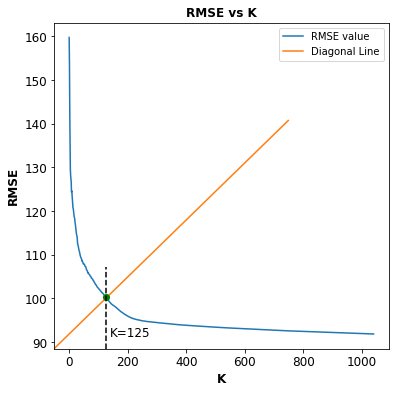

In [45]:
th = 125
st = 'K='+str(th)
f, ax = plt.subplots(figsize=(6, 6))
ax.set_xlabel('K', fontweight ='bold', fontsize = 12)
ax.set_ylabel('RMSE', fontweight ='bold', fontsize = 12)
ax.set_title('RMSE vs K', fontsize = 12, fontweight ='bold')
ax.plot(rmse, '-' , label = 'RMSE value')
ax.tick_params(axis='both', which='major', labelsize=12)
ax.plot([0, 0.7], [0, 0.7], transform=ax.transAxes, label = 'Diagonal Line')
ax.plot(th, rmse[th-1], 'go')
ax.axvline(x=th , ymax = 0.25,ls='--',c='black')
ax.text(th+15, rmse[th-1]-9, st, fontsize=12)
ax.legend()

In [36]:
pred = model.predict(Test,len(Train))
p2 = pred*(U[1] - U[0]) + U[0]
T1 = Test*(U[1] - U[0]) + U[0]

Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of 

Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of state #6, mixture #1 has a null eigenvalue.
Covariance of 

In [37]:
len(DT)

261

In [38]:
xaxis = [DT[i] for i in range(0,len(DT),10)]
ticks = [i+1 for i in range(0,len(DT),10)]

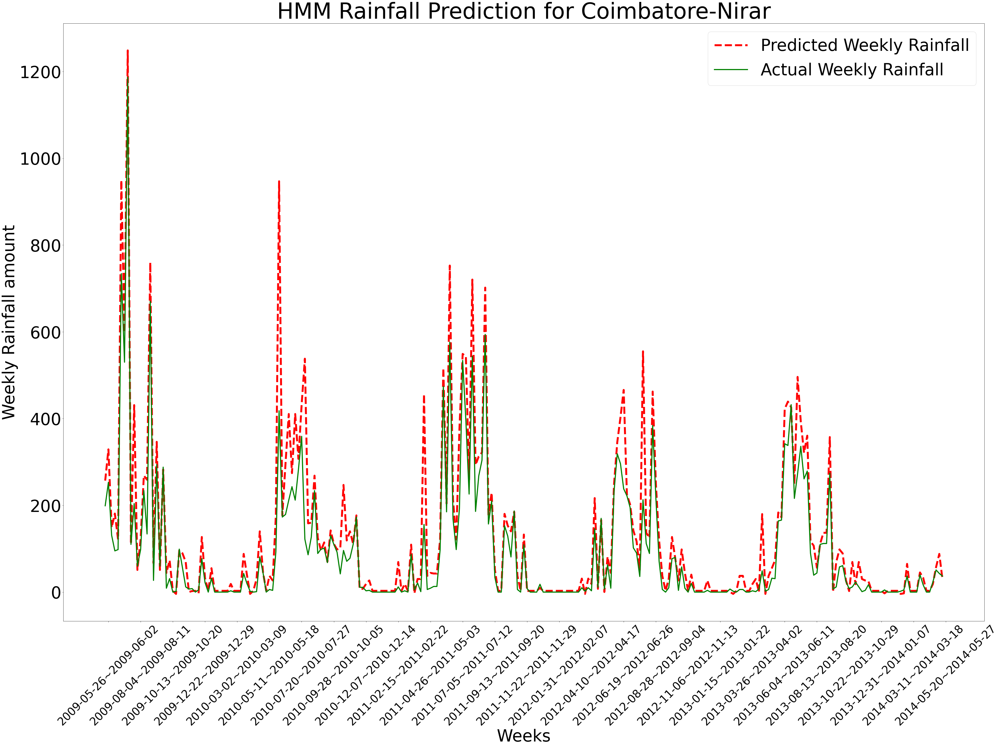

In [45]:
f = plt.figure() 
f.set_figwidth(60) 
f.set_figheight(40)
#plt.tick_params(axis='both', which='major', labelsize=30)
plt.title('HMM Rainfall Prediction for Coimbatore-Nirar', fontsize = 80)
plt.xticks(fontsize=40, rotation=45)
plt.yticks(fontsize=60, rotation=0)
plt.xticks(ticks,xaxis)
plt.ylabel('Weekly Rainfall amount',fontsize=60)
plt.xlabel('Weeks',fontsize=60)
plt.plot(p2-9, 'r', linestyle='--', linewidth='7', label = 'Predicted Weekly Rainfall')
plt.plot(T1, 'g',linestyle='-', linewidth='4', label = 'Actual Weekly Rainfall')
plt.legend(loc='best',prop={'size': 60})

In [48]:
mean_squared_error(T1, p2-9, squared=False)

72.70545454903576

In [49]:
mae(T1,p2-9)

35.90303448874105

In [50]:
d1 = np.array(T1)
d1 = np.reshape(d1 , d1.shape[0])
d2 = np.array(p2)
d2 = np.reshape(d2 , d2.shape[0])

corr, _ = pearsonr(d1, d2)
corr

0.9521036898606449